In [1]:
import os
from glob import glob
import torch
import nibabel as nib



In [2]:
from monai.transforms import (
    Compose,
    EnsureChannelFirstD,
    LoadImaged,
    Resized,
    ToTensord,
    Spacingd,
    Orientationd,
    ScaleIntensityRanged,
    CropForegroundd,
    ResizeWithPadOrCropd,

)
from monai.data import DataLoader, Dataset, CacheDataset
from monai.utils import set_determinism,first

In [3]:
from monai.transforms import (
    Compose,
    LoadImaged, # is becuse we converted labes and images in dictionary form see monai documenation
    ToTensord,
    EnsureChannelFirstd,
    Spacingd,
    ScaleIntensityRanged,
    CropForegroundd,
    Resized,
    CropForegroundd,
    ResizeWithPadOrCropd,
)

from monai.data import Dataset, DataLoader
from monai.utils import first
import matplotlib.pyplot as plt

In [4]:
data_dir = r'C:\Users\rajwn\Videos\monai_ML_project\Atlas\atlas-train-dataset-1.0.1\atlas-train-dataset-1.0.1\train'

In [5]:
train_labels = sorted(glob(os.path.join(data_dir, 'TrainSegmentation','*.nii.gz')))
train_images = sorted(glob(os.path.join(data_dir, 'TrainVolumes','*.nii.gz')))

val_labels = sorted(glob(os.path.join(data_dir, 'TestSegmentation','*.nii.gz')))
val_images = sorted(glob(os.path.join(data_dir, 'TestVolumes','*.nii.gz')))



In [10]:
print("Train-Images:",len(train_images),"\nTrain-Labels:",len(train_labels),"\nTest-Images:",len(val_images),"\nTest-Labels:",len(val_labels))


Train-Images: 55 
Train-Labels: 55 
Test-Images: 5 
Test-Labels: 5


In [11]:
train_files = [{'image':image_name, 'label': label_name} for image_name , label_name in zip(train_images, train_labels)]

In [12]:
val_files = [{'image':image_name, 'label': label_name} for image_name , label_name in zip(val_images, val_labels)]

In [ ]:
train_files[0:5]

# Checking CE_MRI details

In [9]:
volume = nib.load(train_images[45])
h = volume.header
#print(h)
# Image shape (in number of voxels)
n0, n1, n2 = h.get_data_shape()
n0, n1, n2

(320, 260, 72)

In [10]:
# Sampling rate (voexel size in mm)
d0, d1, d2 = h.get_zooms()
d0, d1, d2

(1.25, 1.25, 3.0000007)

In [13]:
# loading images
#perform transformations
#convert to tensor
pixdim = (1.5, 1.5, 1) 


orig_transforms = Compose(

    [
    LoadImaged(keys=['image','label']),
    EnsureChannelFirstd(keys=['image','label']),

    ToTensord(keys=['image', 'label']),

    ] 
)




train_transforms = Compose(
    [
    LoadImaged(keys=['image','label']),
    EnsureChannelFirstd(keys=['image','label']),
    #Spacingd(keys=['image','label'], pixdim = (1.5,1.5,2)),
    Spacingd(keys=["image", "label"], pixdim=pixdim, mode=("bilinear", "nearest")),
    Orientationd(keys=["image", "label"], axcodes="RAS"),
    ScaleIntensityRanged(keys=["image"], a_min=-50, a_max=1250, b_min=0.0, b_max=1.0, clip=True),

    #below adjusts contrast in an image ,, modify this values accordingly
    #ScaleIntensityRanged(keys='image', a_min=-200, a_max=200, b_min=0.0, b_max=1.0, clip=True),
    CropForegroundd(keys=['image','label'], source_key='image'),
    #Resized(keys=['image','label'],spatial_size=[128,128,89] ),
    ResizeWithPadOrCropd(keys=["image", "label"], spatial_size=(448, 352, 64)),

    ToTensord(keys=['image', 'label']),

    ] 
)




# loading images
#perform transformations
#convert to tensor


val_transforms = Compose(

    [
    LoadImaged(keys=['image','label']),
    EnsureChannelFirstd(keys=['image','label']),
    #Spacingd(keys=['image','label'], pixdim = (1.5,1.5,2)),
    Spacingd(keys=["image", "label"], pixdim=pixdim, mode=("bilinear", "nearest")),
    Orientationd(keys=["image", "label"], axcodes="RAS"),
    ScaleIntensityRanged(keys=["image"], a_min=-50, a_max=1250, b_min=0.0, b_max=1.0, clip=True),
    CropForegroundd(keys=['image', 'label'], source_key='vol'),
    ResizeWithPadOrCropd(keys=["image", "label"], spatial_size=(448, 352, 64)),
    #ScaleIntensityRanged(keys='image', a_min=-200, a_max=200, b_min=0.0, b_max=1.0, clip=True),
    

    ToTensord(keys=['image', 'label']),

    ] 
)


In [14]:

orig_ds = Dataset(data=train_files, transform=orig_transforms)
orig_loader = DataLoader(orig_ds, batch_size=1)

train_ds = Dataset(data=train_files, transform=train_transforms)
train_loader = DataLoader(train_ds, batch_size=1)

val_ds = Dataset(data=val_files, transform=val_transforms)
val_loader = DataLoader(val_ds, batch_size=1)

In [15]:
# Get the first patient from train_loader
test_patient = next(iter(train_loader))
print("Test Patient Label Shape:", test_patient['label'].shape)
print("Test Patient Image Shape:", test_patient['image'].shape)

# Get the first patient from orig_loader
orig_patient = next(iter(orig_loader))
print("Original Patient Label Shape:", orig_patient['label'].shape)
print("Original Patient Image Shape:", orig_patient['image'].shape)


Test Patient Label Shape: torch.Size([1, 1, 448, 352, 64])
Test Patient Image Shape: torch.Size([1, 1, 448, 352, 64])
Original Patient Label Shape: torch.Size([1, 1, 512, 368, 88])
Original Patient Image Shape: torch.Size([1, 1, 512, 368, 88])


In [18]:
#test_patient = first(train_loader)
#print(test_patient['label'])
#orig_patient = first(orig_loader)

In [ ]:
print(torch.min(test_patient['image']))
print(torch.max(test_patient['image']))

In [17]:
"""
plt.figure('test',(12,6))
plt.subplot(1 , 3, 1)
plt.title('Slice of a orig patient ')
plt.imshow(orig_patient['image'][0, 0, :, :, 30], cmap= 'gray')


plt.figure('test',(12,6))
plt.subplot(1 ,3, 2)
plt.title('Slice of a patient ')
plt.imshow(test_patient['image'][0, 0, :, :, 30], cmap= 'gray')


plt.figure('test',(12,6))
plt.subplot(1 , 3, 3)
plt.title('Label of a patient ')
plt.imshow(test_patient['label'][0, 0, :, :, 30])

"""

"\nplt.figure('test',(12,6))\nplt.subplot(1 , 3, 1)\nplt.title('Slice of a orig patient ')\nplt.imshow(orig_patient['image'][0, 0, :, :, 30], cmap= 'gray')\n\n\nplt.figure('test',(12,6))\nplt.subplot(1 ,3, 2)\nplt.title('Slice of a patient ')\nplt.imshow(test_patient['image'][0, 0, :, :, 30], cmap= 'gray')\n\n\nplt.figure('test',(12,6))\nplt.subplot(1 , 3, 3)\nplt.title('Label of a patient ')\nplt.imshow(test_patient['label'][0, 0, :, :, 30])\n\n"

In [ ]:
print("Original Intensity Range:", orig_patient['image'].min(), orig_patient['image'].max())
print("Transformed Intensity Range:", test_patient['image'].min(), test_patient['image'].max())


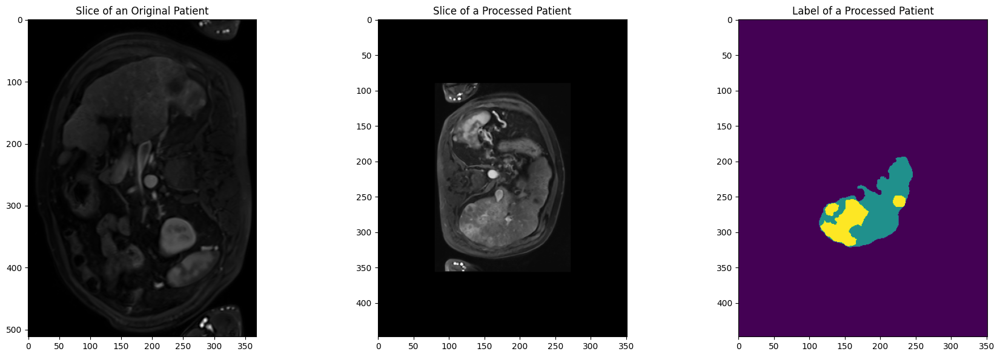

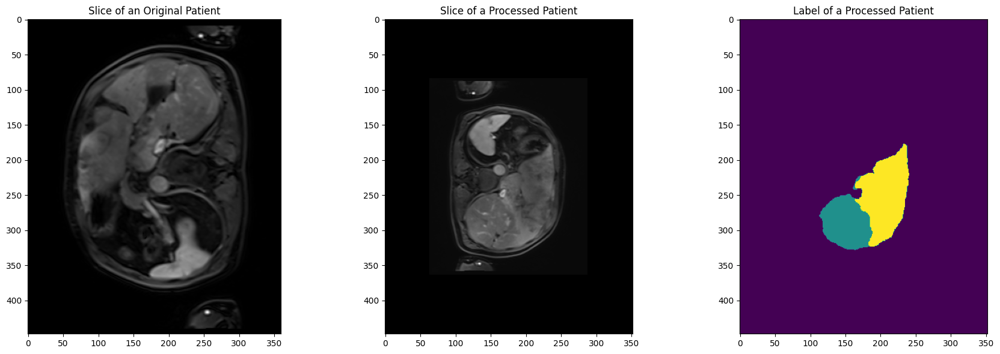

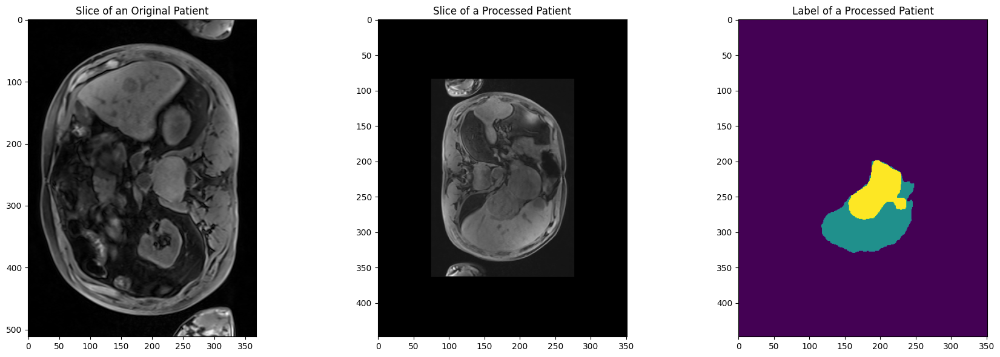

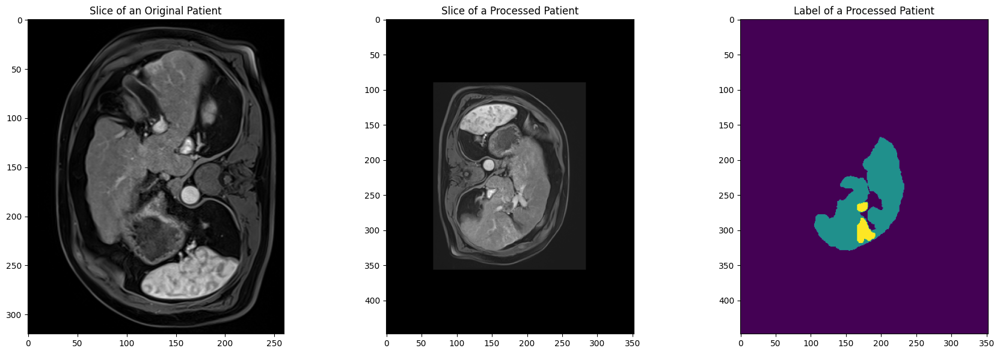

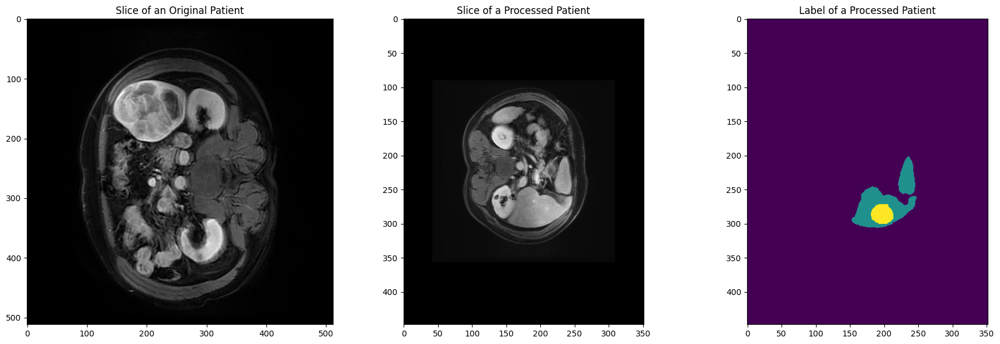

...

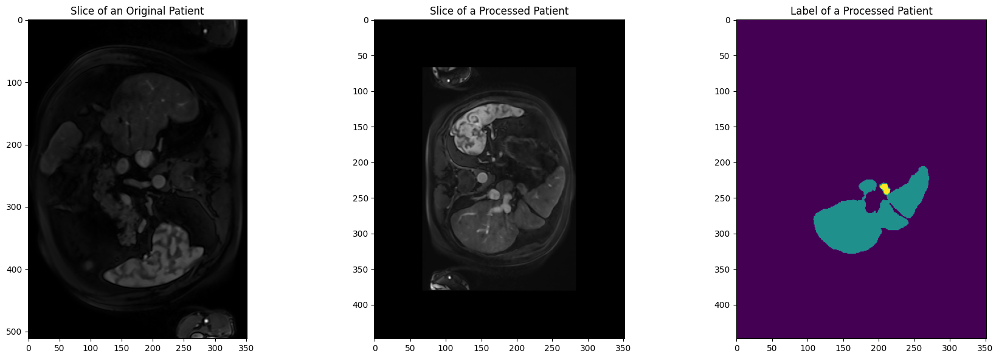

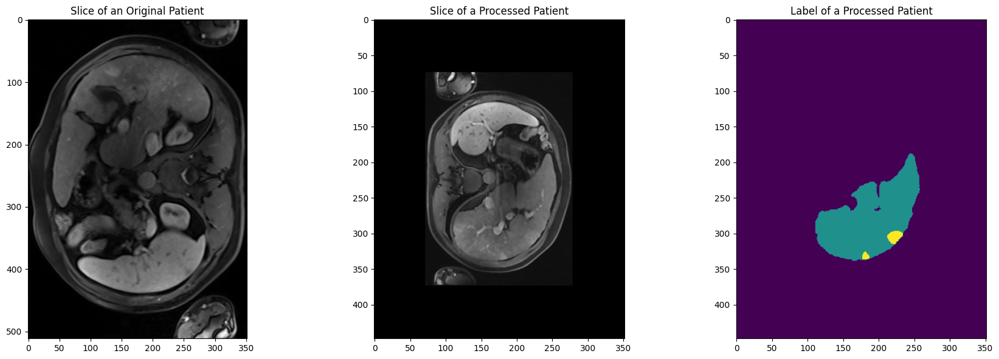

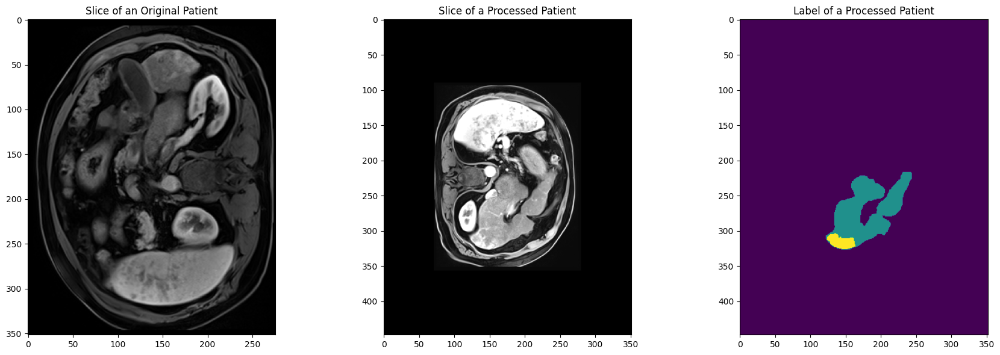

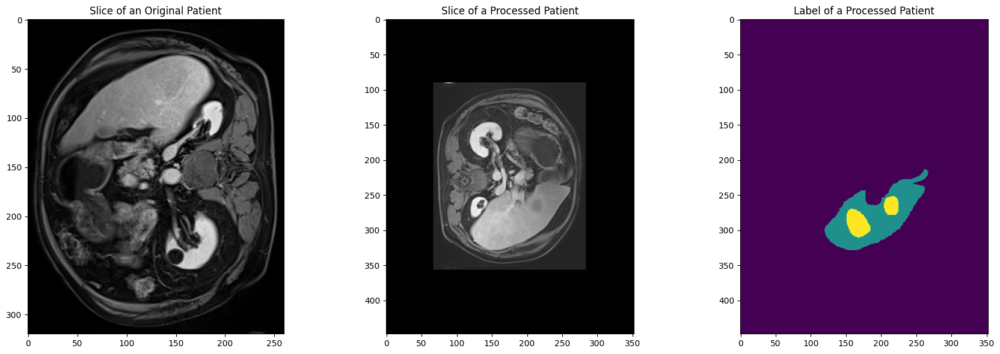

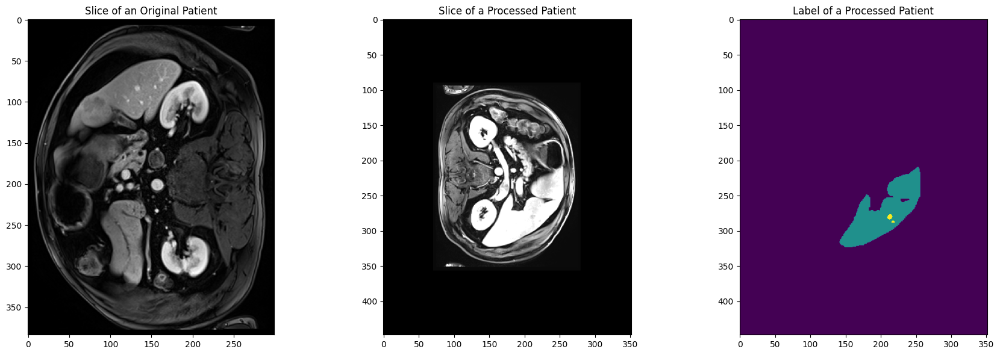

In [19]:
import matplotlib.pyplot as plt

# Function to plot images and labels
def plot_patient(orig_patient, test_patient, slice_idx=30):
    plt.figure('Patient Visualization', figsize=(18, 6))

    # Plot original patient image
    plt.subplot(1, 3, 1)
    plt.title('Slice of an Original Patient')
    plt.imshow(orig_patient['image'][0, 0, :, :, slice_idx], cmap='gray')

    # Plot processed patient image
    plt.subplot(1, 3, 2)
    plt.title('Slice of a Processed Patient')
    plt.imshow(test_patient['image'][0, 0, :, :, slice_idx], cmap='gray')

    # Plot processed patient label
    plt.subplot(1, 3, 3)
    plt.title('Label of a Processed Patient')
    plt.imshow(test_patient['label'][0, 0, :, :, slice_idx], )#cmap='gray'

    plt.tight_layout()
    plt.show()

# Iterate through the train loader and orig loader
for orig_patient, test_patient in zip(orig_loader, train_loader):
    plot_patient(orig_patient, test_patient, slice_idx=30)
